## Tutorial 2 Niche query benchmark on DLPFC dataset

To systematically benchmark niche querying performance on real datasets with a substantial number of samples, we used the Human Dorsolateral Prefrontal Cortex32 (DLPFC) dataset. This dataset consists of 12 well-annotated spatial transcriptomic samples with a total of types of layers.

In [1]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import sys
import logging
import warnings
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
import quest.utils as utils
from quest.trainer import QueSTTrainer

In [3]:
warnings.filterwarnings("ignore")
logger = logging.getLogger(__name__)
logging.basicConfig(level=logging.INFO)

### Read and explore the data

In [4]:
data_path = "../data/DLPFC"
model_path = "../results/DLPFC/model/quest_model.pth"
sample_ids = [
    "151507",
    "151508",
    "151509",
    "151510",
    "151669",
    "151670",
    "151671",
    "151672",
    "151673",
    "151674",
    "151675",
    "151676",
]
adata_list = [sc.read_h5ad(f"{data_path}/{data_id}.h5ad") for data_id in sample_ids]

To include various layer composition scenarios, we defined seven niche types: four composed of two layers, and the rest three composed of three layers. For each niche type, we randomly sampled three replicates in each sample.

In [5]:
niche_groups = [
    "Layer3_Layer4_100",
    "Layer4_Layer5_100",
    "Layer5_Layer6_100",
    "Layer6_WM_100",
    "Layer3_Layer4_Layer5_100",
    "Layer4_Layer5_Layer6_100",
    "Layer5_Layer6_WM_100",
]
niche_replicates = [0, 1, 2]

Here we show all the query niches and ground truth layer annotation.

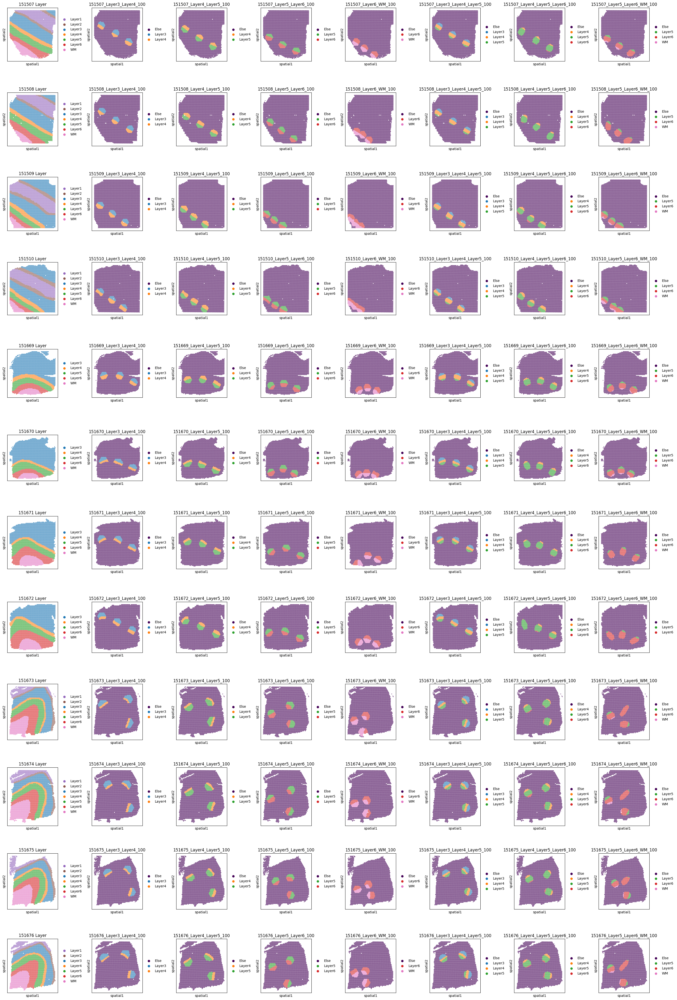

In [6]:
nrows, ncols = 12, 8
fig, axs = plt.subplots(nrows, ncols, figsize=(28, 42))  # figsize is (col, row)
axs = axs.flatten()
for i, sample_name in enumerate(sample_ids):
    sc.pl.spatial(
        adata_list[i],
        color="Layer",
        ax=axs[i * ncols],
        spot_size=5,
        show=False,
        palette=utils.color_dlpfc,
        title=f"{sample_ids[i]} Layer",
    )
    axs[i * ncols].invert_yaxis()
    for j, niche_group in enumerate(niche_groups):
        title = f"{sample_name}_{niche_group}"
        sc.pl.spatial(
            adata_list[i],
            color=f"{niche_group}_layer",
            spot_size=5,
            ax=axs[i * ncols + j + 1],
            show=False,
            palette=utils.color_dlpfc,
            title=title,
        )
        axs[i * ncols + j + 1].invert_yaxis()
fig.tight_layout()
fig.show()

### Configure niche query task

Here we use the niche named Layer5_Layer6_100_replicate=0 on sample 151670 as an example.

In [7]:
dataset = "DLPFC"
query_sample_id = "151670"
query_niches = ["Layer5_Layer6_100_replicate=0_niche"]

We also show the Region Matching Score of this query niche on the other referene samples. We use this score as a ground truth niche similarity measurement.

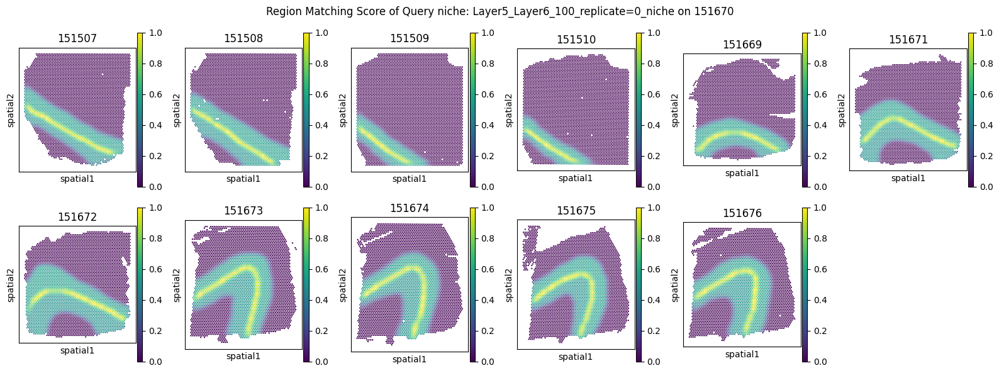

In [8]:
adata_ref_list = [
    adata for adata in adata_list if adata.uns["library_id"] != query_sample_id
]
ref_id_list = [adata.uns["library_id"] for adata in adata_ref_list]
adata_plot = adata_list[sample_ids.index("151673")]
fig, axes = plt.subplots(ncols=6, nrows=2, figsize=(16, 6))
axes = axes.flatten()
for i, adata_ref in enumerate(adata_ref_list):
    sc.pl.spatial(
        adata_ref,
        color=f"{query_sample_id}_Layer5_Layer6_100_replicate=0_region_matching_score",
        spot_size=5,
        show=False,
        title=f"{adata_ref.uns['library_id']}",
        ax=axes[i],
    )
    axes[i].invert_yaxis()
axes[11].axis("off")
fig.suptitle(
    f"Region Matching Score of Query niche: {query_niches[0]} on {query_sample_id}"
)
fig.tight_layout()
fig.show()

### Set up QueST Trainer

In [9]:
trainer = QueSTTrainer(
    dataset=dataset,
    data_path=data_path,
    sample_ids=sample_ids,
    adata_list=adata_list,
    query_niches=query_niches,
    query_sample_id=query_sample_id,
    model_path=model_path,
    epochs=20,
    save_model=True,
    hvg=4000,
    min_count=0,
    normalize=True,
    seed=2024,
)

INFO:quest.trainer:Processing arguments, time: 2025/11/01 16:44:39
INFO:quest.trainer:QueST Trainer initialized, loading data, time: 2025/11/01 16:44:39
INFO:quest.trainer:Data loaded with 12 adata objects, time: 2025/11/01 16:44:39


### Train QueST model

In [10]:
trainer.train()

INFO:quest.trainer:adata 151507 has existing graph
INFO:quest.trainer:adata 151508 has existing graph
INFO:quest.trainer:adata 151509 has existing graph
INFO:quest.trainer:adata 151510 has existing graph
INFO:quest.trainer:adata 151669 has existing graph
INFO:quest.trainer:adata 151670 has existing graph
INFO:quest.trainer:adata 151671 has existing graph
INFO:quest.trainer:adata 151672 has existing graph
INFO:quest.trainer:adata 151673 has existing graph
INFO:quest.trainer:adata 151674 has existing graph
INFO:quest.trainer:adata 151675 has existing graph
INFO:quest.trainer:adata 151676 has existing graph
INFO:quest.utils:preprocessing adata, selecting common features
INFO:quest.utils:gene num before intersection: [33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538]
INFO:quest.utils:33538 common genes identified
INFO:quest.utils:gene num after intersection: [33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538]
INFO:quest.uti

### Use trained QueST model to perform niche query

In [11]:
trainer.inference(save_embedding=False, query=True)

INFO:quest.trainer:Loading model, time: 2025/11/01 17:08:45
INFO:quest.trainer:Performing query: q_id=151670, q_niche=Layer5_Layer6_100_replicate=0_niche, time: 2025/11/01 17:08:56
INFO:quest.trainer:Processing 151507, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151508, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151509, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151510, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151669, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151671, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151672, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151673, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151674, saving predicted niche matching score to Anndata
INFO:quest.trainer:Processing 151675

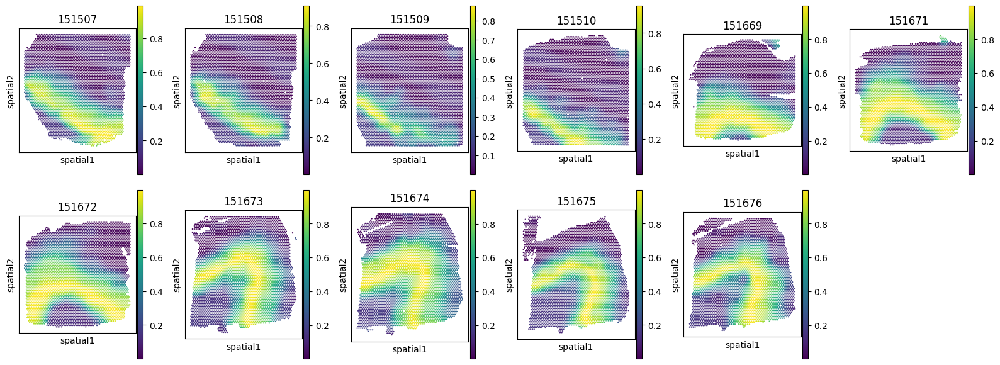

In [12]:
fig, axes = plt.subplots(ncols=6, nrows=2, figsize=(16, 6))
axes = axes.flatten()
query_niche = query_niches[0]
adata_ref = trainer.adata_ref_list[0]
for i, adata_ref in enumerate(trainer.adata_ref_list):
    sc.pl.spatial(
        adata_ref,
        color=f"{query_niche} predicted matching score",
        ax=axes[i],
        show=False,
        spot_size=5,
        title=f"{adata_ref.uns['library_id']}",
    )
    axes[i].invert_yaxis()
axes[11].axis("off")
fig.tight_layout()
fig.show()